In [64]:
import pandas as pd
import numpy as np
from datetime import datetime
import scipy.stats 

In [2]:
dates= list(map(str,range(20171220, 20171232))) + list(map(str,range(20180101,20180121)))

dict_df={}
for date in dates:
    dict_df["df_{}".format(date)]=pd.read_csv("flights{}.csv".format(date))

In [3]:
df_flights=pd.concat(dict_df.values(), ignore_index=True)
print(df_flights)

         airline_name flight_cost   depart_time     arrive_time  \
0              United       $199    LGA 6:00 AM     LAX 3:28 PM   
1            Frontier       $259    LGA 9:20 AM     LAX 6:14 PM   
2              Spirit       $260    LGA 9:59 PM   LAX 8:26 AM+1   
3              United       $262    LGA 8:03 PM   LAX 1:37 AM+1   
4              United       $262    LGA 7:03 PM   LAX 1:37 AM+1   
5            Frontier       $265    LGA 9:20 AM   LAX 8:39 AM+1   
6              Alaska       $266    LGA 6:30 AM     LAX 2:00 PM   
7              United       $266    LGA 6:00 AM     LAX 1:32 PM   
8              United       $266    LGA 6:00 AM     LAX 2:50 PM   
9      Virgin America       $268    JFK 7:50 AM     LAX 7:00 PM   
10             United       $269    EWR 5:55 AM     LAX 9:18 AM   
11             United       $269    EWR 7:10 AM    LAX 10:33 AM   
12     Virgin America       $270    JFK 7:50 AM     LAX 4:17 PM   
13        Sun Country       $279    JFK 7:00 AM    LAX 12:05 P

In [4]:
print(type(df_flights.depart_time[0]))
print(type(df_flights.flight_cost[0]))

<class 'str'>
<class 'str'>


In [5]:
#drop review url tab and drop rows for airline name: multiple airlines
df_flights.drop(["review_url"],axis=1, inplace=True)
df_flights=df_flights[df_flights["airline_name"]!="Multiple Airlines"]

In [6]:
#strip dollar sign, replace missing value with 0, convert to int
df_flights["flight_cost"]=df_flights["flight_cost"].replace(np.nan,"0")

df_flights["flight_cost"]=df_flights["flight_cost"].str.replace(',','')
df_flights["flight_cost"]=df_flights["flight_cost"].str.replace('$','')

df_flights["flight_cost"]=df_flights["flight_cost"].astype(int)


In [7]:
#strip Flyscore: in flight flyscore, replace missing value with 0, convert to float
df_flights["flight_flyscore"]=df_flights["flight_flyscore"].replace(np.nan,"0")
df_flights["flight_flyscore"]=df_flights["flight_flyscore"].apply(lambda x: x.strip('FlyScore:'))
df_flights["flight_flyscore"]=df_flights["flight_flyscore"].astype(float)


In [8]:
#strip airline rating, replace missing values with 0, convert to float
df_flights["airline_rating"]=df_flights["airline_rating"].replace(np.nan,"0")
df_flights["airline_rating"]=df_flights["airline_rating"].str.replace(' of 5 bubbles','')
df_flights["airline_rating"]=df_flights["airline_rating"].astype(float)


In [9]:
#strip airport in depart and arrive time, add new column for departure and arrival airport

def airport_column(column):
    
    split_list=column.apply(lambda x: x.split())

    airport=split_list.apply(lambda x: x[0])

    time= split_list.apply(lambda x: x[1]+x[2])

    return (airport,time)
    
df_flights["departure_airport"]=airport_column(df_flights["depart_time"])[0]
df_flights["depart_time"]= airport_column(df_flights["depart_time"])[1].apply(lambda x: x.replace('+1',''))


df_flights["arrival_airport"]=airport_column(df_flights["arrive_time"])[0]
df_flights["arrive_time"]=airport_column(df_flights["arrive_time"])[1].apply(lambda x: x.replace('+1',''))




In [10]:
#convert date to datetime
df_flights["date"]=pd.to_datetime(df_flights["date"])
print(df_flights[df_flights["date"]=="2017-12-30"])

         airline_name  flight_cost depart_time arrive_time flight_duration  \
19774        Frontier          259      9:20AM      6:14PM         11h 54m   
19775        Frontier          259      9:20AM      6:14PM         11h 54m   
19776        Frontier          265      9:20AM     11:51PM         17h 31m   
19777           Delta            0      9:00PM     11:56PM          5h 56m   
19778        Frontier          265      9:20AM      8:39AM         26h 19m   
19779        Frontier          265      9:20AM      8:39AM         26h 19m   
19780          Alaska          305      6:30AM      2:00PM         10h 30m   
19781          United          318      6:15PM      9:19PM           6h 4m   
19782          United          318      8:45AM     11:56AM          6h 11m   
19783          United          318      3:00PM      6:20PM          6h 20m   
19784          United          318      6:30AM      9:51AM          6h 21m   
19785          United          318      9:59PM      1:20AM      

In [11]:
#convert flight duration to minutes
list_flight_dur=df_flights["flight_duration"].apply(lambda x: x.split())

hour=list_flight_dur.apply(lambda x: x[0].replace('h','')).astype(int)*60

minutes= list_flight_dur.apply(lambda x: x[1].replace('m','')).astype(int)


df_flights["flight_duration"]= hour+minutes



In [297]:
print(df_flights)
df_flights.to_csv("clean_flights.csv")

         airline_name  flight_cost depart_time arrive_time  flight_duration  \
0              United          199      6:00AM      3:28PM              748   
1            Frontier          259      9:20AM      6:14PM              714   
2              Spirit          260      9:59PM      8:26AM              807   
3              United          262      8:03PM      1:37AM              514   
4              United          262      7:03PM      1:37AM              574   
5            Frontier          265      9:20AM      8:39AM             1579   
6              Alaska          266      6:30AM      2:00PM              630   
7              United          266      6:00AM      1:32PM              632   
8              United          266      6:00AM      2:50PM              710   
9      Virgin America          268      7:50AM      7:00PM              850   
10             United          269      5:55AM      9:18AM              383   
11             United          269      7:10AM     1

In [12]:
import plotly.offline as offline
import plotly.graph_objs as go
from plotly import tools
offline.offline.init_notebook_mode(connected=True)

In [23]:
#plot mean flight cost over time for each destination

df_filter_cost= df_flights[df_flights["flight_cost"]!=0]
df_date_airport= df_filter_cost.groupby(['date','arrival_airport'], as_index=False)["flight_cost"].mean()

data=[]
for airport in df_date_airport["arrival_airport"].unique():
    df_airport=df_date_airport[df_date_airport["arrival_airport"]==airport]
    data.append(go.Scatter(x=df_airport["date"], y=df_airport["flight_cost"],name=airport))


layout = dict(
    title = "Average Flight Price Over Time by Destination",
    xaxis = dict(title='Date'),
    yaxis=dict(title='Flight Price($)'))

fig= dict(data=data, layout=layout)
offline.iplot(fig)

In [22]:
#plot flight cost by airline and destination

df_filter_cost= df_flights[df_flights["flight_cost"]!=0]
df_airline_airport= df_filter_cost.groupby(['date', 'arrival_airport','airline_name'],as_index=False)["flight_cost"].mean()


def flight_cost_airline_destination(df_airline_airport, dest):
    df_airline_dest= df_airline_airport[df_airline_airport["arrival_airport"]== dest]
    
    data=[]
    for airline in df_airline_dest["airline_name"].unique():
        df_airline=df_airline_dest[df_airline_dest["airline_name"]==airline]
        data.append(go.Scatter(x=df_airline["date"], y=df_airline["flight_cost"],name=airline))


    layout = dict(
        title = "Average Flight Price Over Time by Airline from NYC to {}".format(df_airline_dest.arrival_airport.unique()[0]),
        xaxis = dict(title='Date'),
        yaxis=dict(title='Flight Price ($)'))

    fig= dict(data=data, layout=layout)
    offline.iplot(fig)


flight_cost_airline_destination(df_airline_airport, "LAX")
flight_cost_airline_destination(df_airline_airport, "HNL")
flight_cost_airline_destination(df_airline_airport, "SFO")
flight_cost_airline_destination(df_airline_airport, "MIA")
flight_cost_airline_destination(df_airline_airport, "LAS")

             


In [66]:
# plot distribution of flight prices over 1 month (Dec to Jan)

df_dist= df_filter_cost.filter(['arrival_airport','airline_name','flight_cost'])

data=[df_dist["flight_cost"]]

fig=ff.create_distplot(data, ["flight_price"], curve_type='normal',bin_size=50)
fig['layout'].update(title='Distribution of Flight Prices From Dec 20 to Jan 20')
offline.iplot(fig)







C:\Users\hans\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1326: UserWarning:

p-value may not be accurate for N > 5000.



(0.8253012895584106, 0.0)

As seen above, the distribution of flight prices is right skewed ie. mean is greater than the median. Transformation of this distribution possibly log transformation will make data normal.

In [75]:
#plot distribution of flight cost by airline
import plotly.figure_factory as ff

df_dist= df_filter_cost.filter(['arrival_airport','airline_name','flight_cost'])



def distribution_airline_destination(df_dist, dest):
    df_airline_dest= df_dist[df_dist["arrival_airport"]== dest]
    
    
    data=[]
    for airline in df_airline_dest["airline_name"].unique():
        df_airline=df_airline_dest[df_airline_dest["airline_name"]==airline]

        data.append(go.Box(y=df_airline["flight_cost"],x=df_airline["arrival_airport"],name='{}'.format(airline)))

    #fig=ff.create_distplot(data, df_airline_dest["airline_name"].unique(), curve_type='normal',bin_size=50)
    #fig['layout'].update(title='Distribution of Flight Prices by Airline from NYC to {}'.format(dest))
    
    
    layout =go.Layout(title='Distribution of Flight Prices by Airline from NYC to {}'.format(dest),boxmode='group')
    
    fig=go.Figure(data=data,layout=layout)
    offline.iplot(fig)
    
    
    

distribution_airline_destination(df_dist, "LAX")
distribution_airline_destination(df_dist, "HNL")
distribution_airline_destination(df_dist, "SFO")
distribution_airline_destination(df_dist, "MIA")
distribution_airline_destination(df_dist, "LAS")

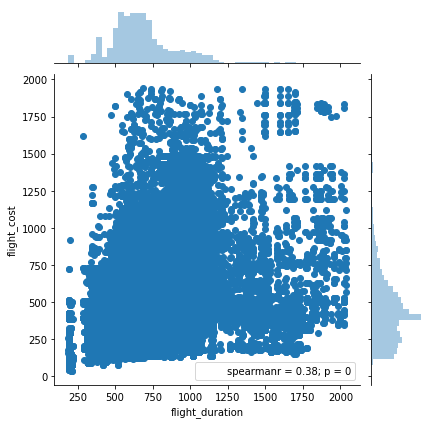

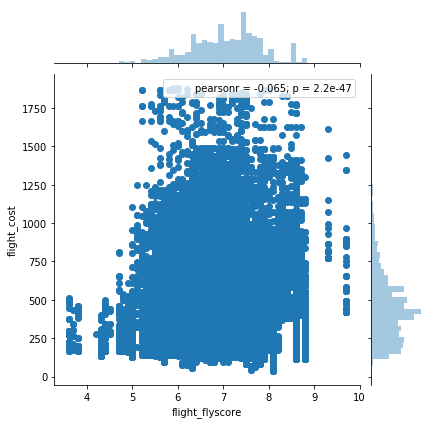

In [61]:
#plot ratings by airline, find correlation between rating, flight duration on flight cost
import seaborn as sns

%matplotlib inline

df_flyscore_cost=df_filter_cost.filter(['flight_flyscore','flight_cost'])

df_flyscore_cost=df_flyscore_cost[df_flyscore_cost["flight_flyscore"]!=0]

#remove outliers
df_flyscore_cost= df_flyscore_cost.loc[df_flyscore_cost.apply(lambda x: np.abs(x - x.mean()) / x.std() < 5).all(axis=1)]

df_dur_cost=df_filter_cost.filter(['flight_duration', 'flight_cost'])
df_dur_cost= df_dur_cost.loc[df_dur_cost.apply(lambda x: np.abs(x - x.mean()) / x.std() < 5).all(axis=1)]

sns.jointplot(df_dur_cost['flight_duration'], df_dur_cost['flight_cost'], stat_func=spearmanr)
sns.jointplot(df_flyscore_cost['flight_flyscore'], df_flyscore_cost['flight_cost'])